**UKLJUČIVANJE POTREBNIH ZAGLAVLJA I UČITAVANJE PODATAKA**

In [1]:
import random
import networkx as nx
from matplotlib import pyplot as plt
import numpy as np
import json 

In [2]:
# definisanje veličina koje će biti potrebne za provere da li je ulazna željena vrednost iz korektnog intervala
min_nodes = 1
max_nodes = 100

min_degree = 1
max_degree = 50

min_components = 1
max_components = 5

edge_prob = 0.5

In [3]:
def read_instance(filepath):
    with open(filepath) as f: 
        data = f.read() 
    # Rekonstrukcija sadrzaja fajla
    js = json.loads(data) 
  
    return js

In [4]:
inst1 = read_instance('testPrimeri/test1.txt')
inst2 = read_instance('testPrimeri/test2.txt')
inst3 = read_instance('testPrimeri/test3.txt')
inst4 = read_instance('testPrimeri/test4.txt')
inst5 = read_instance('testPrimeri/test5.txt')
inst6 = read_instance('testPrimeri/test6.txt')
inst7 = read_instance('testPrimeri/test7.txt')

In [5]:
def write_to_file(population_size, num_nodes, avg_degree, clustering_coeff, num_components, transitivity, res, file_name):
    f = open(file_name, "w")
    f.write("Population size: " + str(population_size) + "\n\n")
    f.write("Desired properties:\n")
    f.write("\tNum of nodes: " + str(num_nodes) + "\n")
    f.write("\tAverage degree: " + str(avg_degree) + "\n")
    f.write("\tTransitivity: " + str(transitivity) + "\n")
    f.write("\tClustering coefficient: " + str(clustering_coeff) + "\n")
    f.write("\tNum of connected components: " + str(num_components) + "\n\n")
    f.write("Results:\n")
    f.write("\tNode degrees: " + str(nx.degree(res.graph)) + "\n")
    f.write("\tAverage clustering coefficient: " + str(nx.average_clustering(res.graph)) + "\n")
    f.write("\tNumber of connected components: " + str(len([len(c) for c in 
                                                            sorted(nx.connected_components(res.graph), key = len, reverse = True)])) + "\n")
    f.write("\tTransivity: " + str(nx.transitivity(res.graph)) + "\n")
    f.write("\tFitness: " + str(res.fitness) + "\n")
    f.close()

**DEFINISANJE FUNKCIJA POTREBNIH ZA IMPLEMENTACIJU GENETSKOG ALGORITMA KOJI ĆE IMATI ULOGU DA GENERIŠE GRAFOVE**

In [6]:
class Individual:
    def __init__(self, num_nodes, avg_degree, avg_clustering_coeff, num_components, transitivity):
        self.num_components = num_components
        self.num_nodes = num_nodes
        self.avg_clustering_coeff = avg_clustering_coeff
        self.avg_degree = avg_degree
        self.graph = nx.erdos_renyi_graph(self.num_nodes, edge_prob)
        self.transitivity = transitivity
        self.fitness = self.calc_fitness()
        
    def calc_fitness(self):
        num_of_graph_nodes = len(self.graph.nodes)
        graph_avg_degree = sum([self.graph.degree[i] for i in self.graph.nodes]) / self.num_nodes
        graph_connected_components = nx.number_connected_components(self.graph)
        graph_clustering_coefficient = nx.average_clustering(self.graph)
        graph_transitivity = nx.transitivity(self.graph)
        # Sve vrednosti koje ulaze u jednačinu za fitness prebacujemo u interval [0,1] da ne bi broj čvorova, komponenti i stepen imali
        # veći uticaj od ostalog
        # normalizacija je: (X - Xmin)/(Xmax - Xmin)
        max_deg = max(graph_avg_degree, max_degree)

        max_comp = max(graph_connected_components, max_components)

        #(abs(num_of_graph_nodes - self.num_nodes)) / (max_nodes - min_nodes) -- ne treba jer je br čvorova vec sređen
        return - (abs(graph_avg_degree - self.avg_degree) / max_deg  + 
                 abs(graph_clustering_coefficient - self.avg_clustering_coeff) +
                 abs(graph_transitivity - self.transitivity) +
                 abs(graph_connected_components - self.num_components) / max_comp)

In [7]:
def selection(population, tournament_size):
    chosen = random.sample(population, tournament_size)
    return max(chosen, key = lambda x: x.fitness)

In [8]:
"""def combine_matrices(matrix1, matrix2, i1, j1):
    # Create a new matrix with the same shape as matrix1
    adj_mat_cld1 = np.zeros_like(matrix1)
    adj_mat_cld2 = np.zeros_like(matrix1)

    for i in range(len(matrix1)):
        for j in range(len(matrix1[i])):
            if i <= i1 and j <= j1:
                adj_mat_cld1[i, j] = matrix1[i, j]
                adj_mat_cld2[i, j] = matrix2[i, j]
                
                adj_mat_cld1[j, i] = adj_mat_cld1[i, j]
                adj_mat_cld2[j, i] = adj_mat_cld2[i, j]
            else:
                adj_mat_cld2[i, j] = matrix1[i, j]
                adj_mat_cld1[i, j] = matrix2[i, j]
                
                adj_mat_cld1[j, i] = adj_mat_cld1[i, j]
                adj_mat_cld2[j, i] = adj_mat_cld2[i,j]


    return adj_mat_cld1, adj_mat_cld2

# Example usage:
matrix1 = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
matrix2 = np.array([[10, 11, 12], [13, 14, 15], [16, 17, 18]])

# Choose random variables i and j (e.g., you can replace these with actual random values)
i = 1
j = 1

result, res = combine_matrices(matrix1, matrix2, i, j)
print(result)
print(res)
"""

[[ 1  4 16]
 [ 4  5 17]
 [16 17 18]]
[[10 13  7]
 [13 14  8]
 [ 7  8  9]]


In [8]:
def crossover(parent1, parent2, child1, child2):
    n = parent1.num_nodes
    random_pos = random.randrange(0, int(np.floor(n/2)))
    random_pos2 = random.randrange(int(np.floor(n/2)), n)
    
    adj_mat_par1 = nx.to_numpy_array(parent1.graph)
    adj_mat_par2 = nx.to_numpy_array(parent2.graph)
    
    adj_mat_cld1 = np.zeros_like(adj_mat_par1)
    adj_mat_cld2 = np.zeros_like(adj_mat_par1)

    for i in range(len(adj_mat_par1)):
        for j in range(len(adj_mat_par1[i])):
            if i <= random_pos and j <= random_pos2:
                adj_mat_cld1[i, j] = adj_mat_par1[i, j]
                adj_mat_cld2[i, j] = adj_mat_par2[i, j]
                
                adj_mat_cld1[j, i] = adj_mat_cld1[i, j]
                adj_mat_cld2[j, i] = adj_mat_cld2[i, j]
            else:
                adj_mat_cld2[i, j] = adj_mat_par1[i, j]
                adj_mat_cld1[i, j] = adj_mat_par2[i, j]
                
                adj_mat_cld1[j, i] = adj_mat_cld1[i, j]
                adj_mat_cld2[j, i] = adj_mat_cld2[i, j]
                
    child1.graph = nx.from_numpy_array(adj_mat_cld1)
    child2.graph = nx.from_numpy_array(adj_mat_cld2)

In [9]:
def mutation(individual, mutation_prob):
    adj_mat = nx.to_numpy_array(individual.graph)
    for i in range(len(adj_mat)):
        for j in range(len(adj_mat[i])):
            if random.random() < mutation_prob and i < j:
                adj_mat[i,j] = not adj_mat[i,j]
                adj_mat[j,i] = not adj_mat[j,i]
    individual.graph = nx.from_numpy_array(adj_mat)

In [10]:
def ga(num_nodes = 50, avg_degree = 25, avg_cluster_coeff = 0.5, num_connected_components = 1, transitivity = 0.5,
       population_size = 100, num_generations = 20, tournament_size = 7, elitism_size = 10, mutation_prob = 0.05):
    population = [Individual(num_nodes = num_nodes, avg_degree = avg_degree, avg_clustering_coeff = avg_cluster_coeff, 
                             transitivity = transitivity, num_components = num_connected_components) for _ in range(population_size)]
    new_population = population.copy()
    
    for i in range(num_generations):
        population.sort(key = lambda x: x.fitness, reverse = True)
        new_population[:elitism_size] = population[:elitism_size]
        for j in range(elitism_size, population_size, 2):
            parent1 = selection(population, tournament_size)
            parent2 = selection(population, tournament_size) 

            # želimo da roditelji budu različite jedinke
            while(parent1 == parent2):
                parent2 = selection(population, tournament_size) 
            
            crossover(parent1, parent2, child1 = new_population[j], child2 = new_population[j+1])

            mutation(new_population[j], mutation_prob)
            mutation(new_population[j+1], mutation_prob)
            
            new_population[j].fitness = new_population[j].calc_fitness()
            new_population[j+1].fitness = new_population[j+1].calc_fitness()
        
        population = new_population.copy()
    return max(population, key = lambda x: x.fitness)

**DEFINISANJE ULAZNIH VREDNOSTI ALGORITMA I POKRETANJE ALGORITMA ZA RAZLIČITE ULAZNE VREDNOSTI**

In [11]:
num_of_nodes = []
avg_degrees = []
cluster_coeffs = []
connected_components = []
transitivity = []
population_size = [100, 50] * 7
num_generations = 20
tournament_size = 7
elitism_size = 10
mutation_prob = 0.05

instances = [inst1, inst1, inst2, inst2, inst3, inst3, inst4, inst4, inst5, inst5, inst6, inst6, inst7, inst7]

In [12]:
for elem in instances:
    num_of_nodes.append(elem['num nodes'])
    avg_degrees.append(elem['average degree'])
    cluster_coeffs.append(elem['clustering coefficient'])
    connected_components.append(elem['num of connected components'])
    transitivity.append(elem['transitivity'])
print(num_of_nodes)
print(avg_degrees)
print(cluster_coeffs)
print(connected_components)
print(transitivity)

[6, 6, 10, 10, 10, 10, 25, 25, 50, 50, 75, 75, 100, 100]
[3.33, 3.33, 2, 2, 7.5, 7.5, 2.8, 2.8, 14.5, 14.5, 44.7, 44.7, 3.2, 3.2]
[0.7, 0.7, 0, 0, 0.83, 0.83, 0.13, 0.13, 0.31, 0.31, 0.6, 0.6, 0.03, 0.03]
[1, 1, 1, 1, 1, 1, 4, 4, 1, 1, 1, 1, 5, 5]
[0.75, 0.75, 0, 0, 0.83, 0.83, 0.12, 0.12, 0.31, 0.31, 0.6, 0.6, 0.02, 0.02]


In [13]:
lists = [num_of_nodes, avg_degrees, cluster_coeffs, connected_components, transitivity]

for list in lists:
    if any(elem is None or elem < 0 for elem in list):
        raise Exception("Invalid argument! All arguments must be >= 0!")
        
for node in num_of_nodes:
    if node not in range(min_nodes, max_nodes + 1):
        raise Exception("Invalid argument! Number of nodes must be between 1 and 100!")
        
for component in connected_components:
    if component not in range(min_components, max_components+1):
        raise Exception("Invalid argument! Number of components must be between 1 and 5!")
        
for degree in avg_degrees:
    if degree > max_degree:
        raise Exception("Invalid argument! Average node degree must be between 1 and 50!")
        
for cluster_coef in cluster_coeffs:
    if cluster_coef > 1:
        raise Exception("Invalid argument! Clustering coefficient must be between 0 and 1!")
        
for tr in transitivity:
    if tr > 1:
        raise Exception("Invalid argument! Transitivity must be between 0 and 1!")

-0.005622222222222093
-0.005622222222222093
-0.0
-0.0
-0.018649029982363168
-0.008490299823633132
-0.8832440425540713
-0.9116404928404928
-0.25750585310408725
-0.22903390715500593
-0.09062161448330536
-0.13018272330208663
-2.4304182119027153
-2.463823741959615


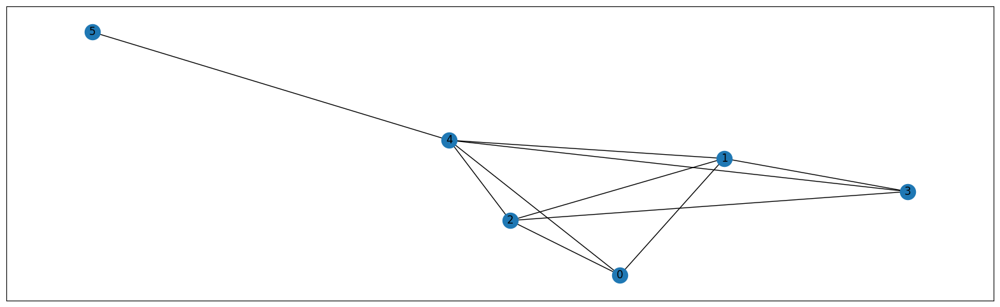

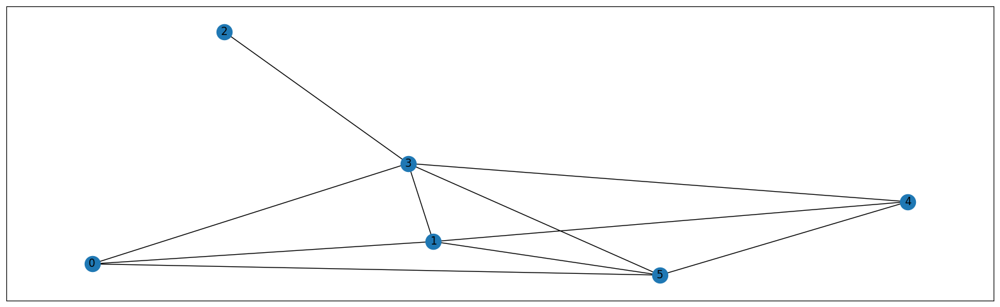

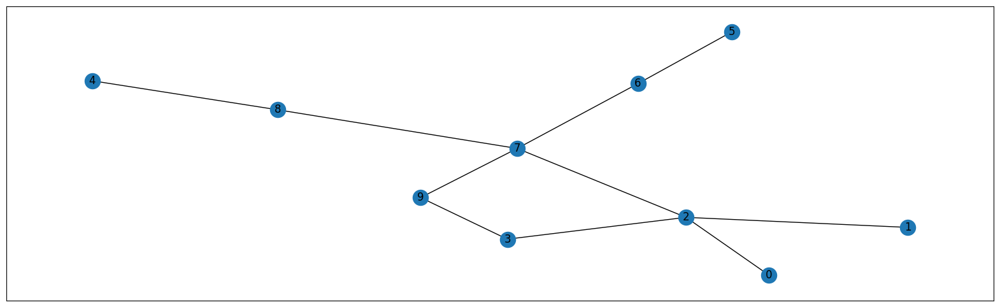

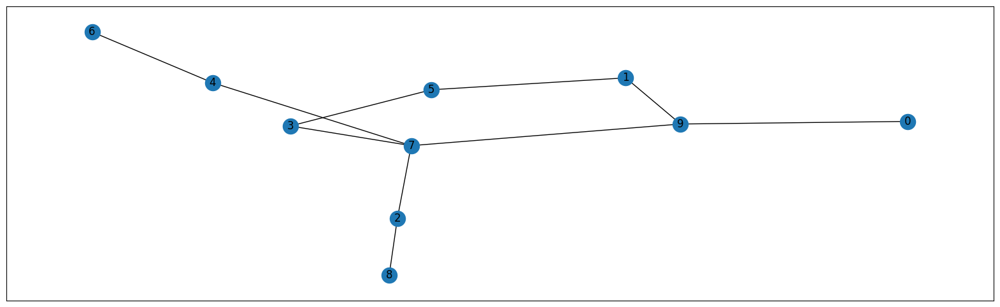

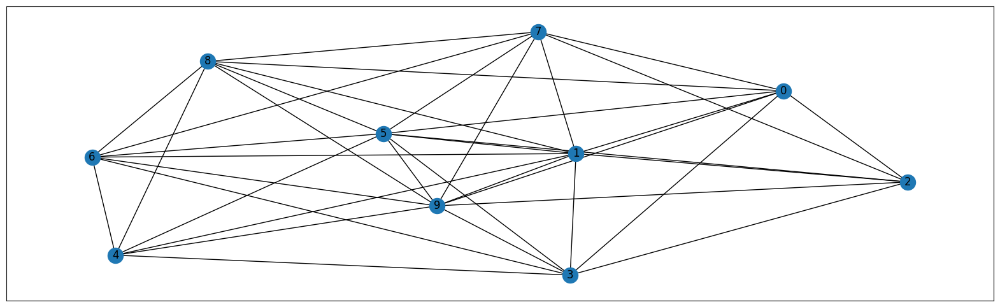

...

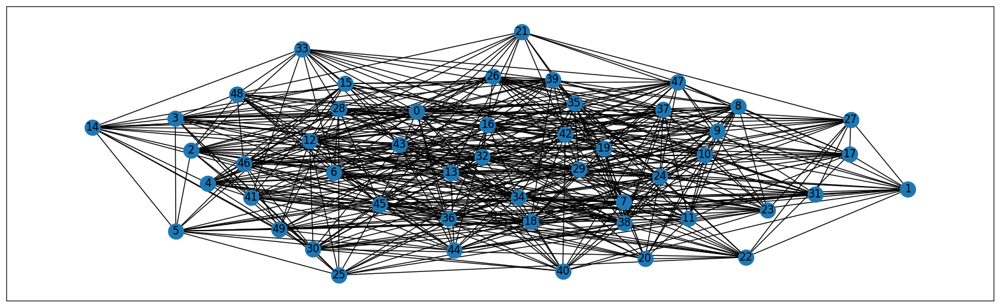

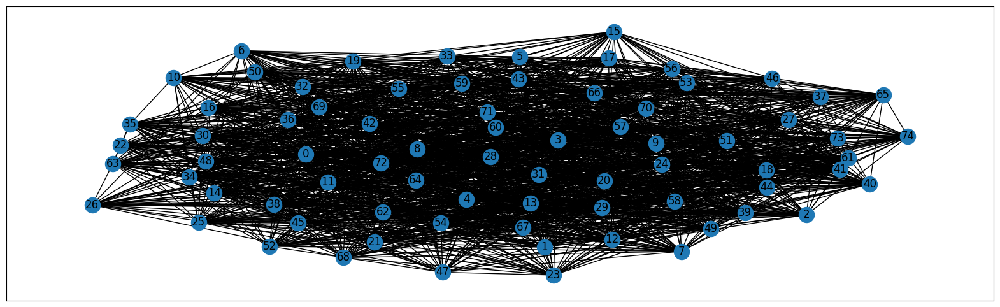

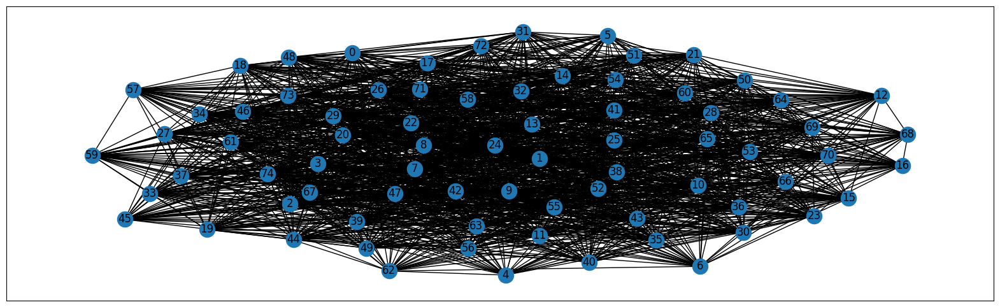

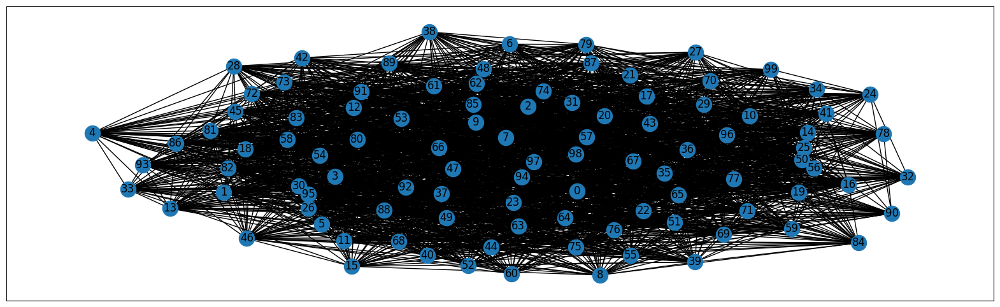

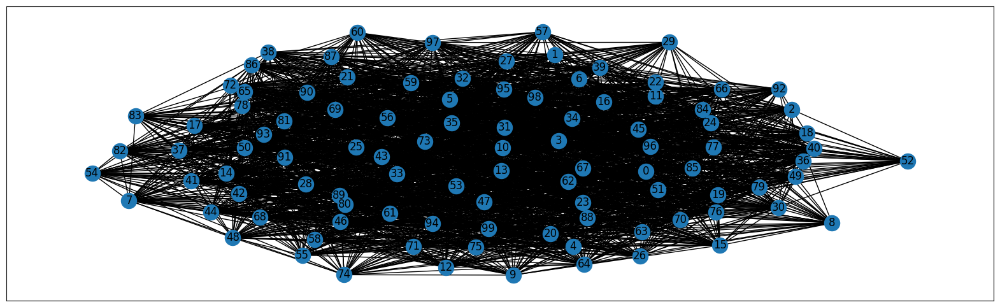

In [15]:
fitness_list = []
for i in range(len(num_of_nodes)):
    res = ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], 
           population_size[i], num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1, 1, figsize = (20, 6))
    nx.draw_networkx(res.graph)

    filename = "rezultati/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + ".txt"
    write_to_file(population_size[i], num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], 
                  connected_components[i], transitivity[i], res, filename)
    plt.savefig("slike/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + ".png")

**POSTOJI LI LINEARNI MODEL KOJI BI NA OSNOVU NEKE OD KOMPONENATA MOGAO DA PREDVIDI VREDNOST FITNESS FUNKCIJE?**

In [16]:
import pandas as pd

Text(0.5, 0, 'Number of nodes')

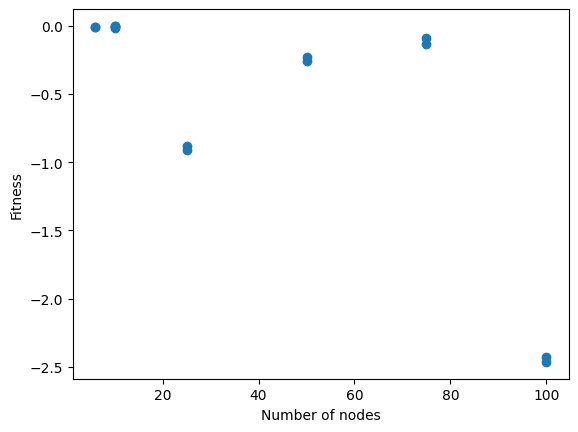

In [17]:
plt.scatter(num_of_nodes, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Number of nodes")

Text(0.5, 0, 'Average node degree')

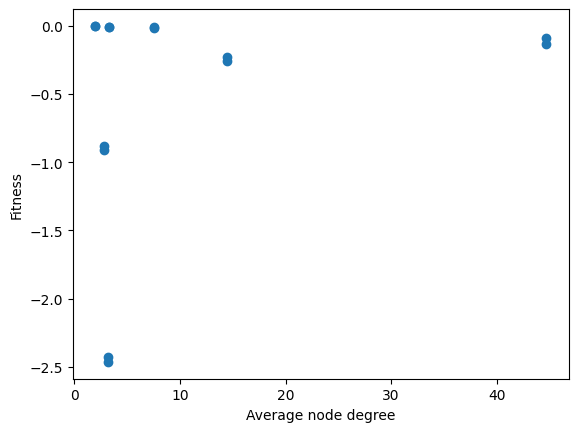

In [18]:
plt.scatter(avg_degrees, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Average node degree")

Text(0.5, 0, 'Number of connected components')

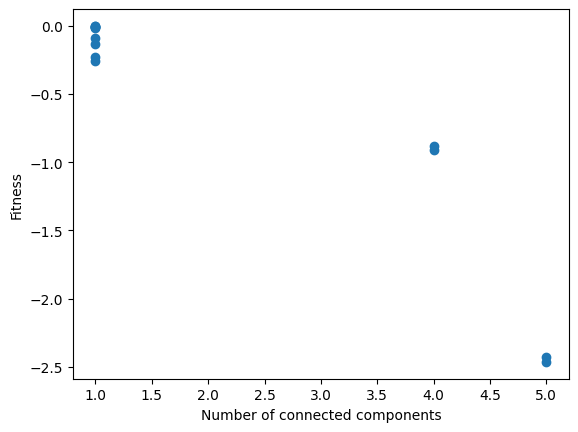

In [19]:
plt.scatter(connected_components, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Number of connected components")

Text(0.5, 0, 'Graph transitivity')

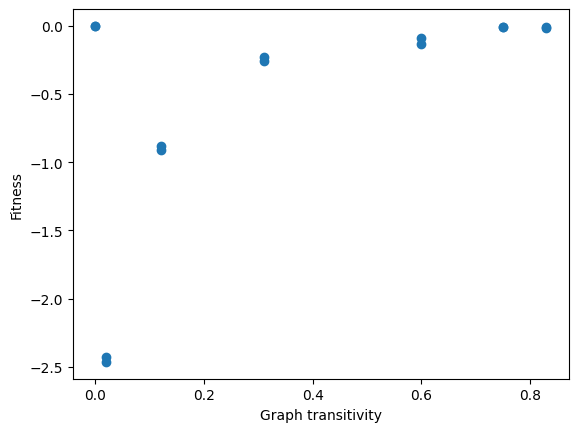

In [20]:
plt.scatter(transitivity, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Graph transitivity")

Text(0.5, 0, 'Average clustering coefficient')

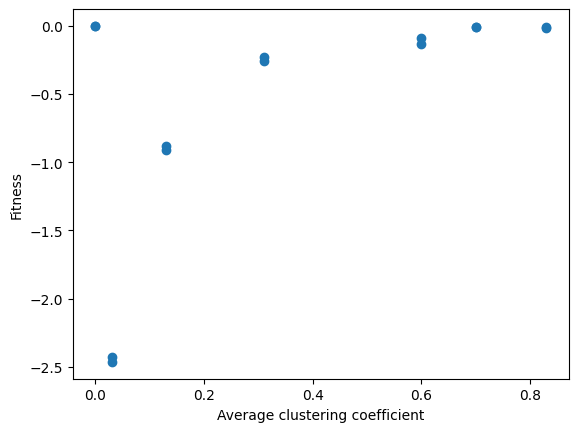

In [21]:
plt.scatter(cluster_coeffs, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Average clustering coefficient")

In [22]:
data = {
    'fitness': fitness_list,
    'num_of_nodes': num_of_nodes,
    'avg_degree': avg_degrees,
    'num_components': connected_components,
    'transitivity': transitivity,
    'clustering_coeff': cluster_coeffs
}

dataframe = pd.DataFrame(data, columns = ['fitness', 'num_of_nodes', 'avg_degree', 'num_components', 'transitivity', 'clustering_coeff'])

# formiranje matrice korelacije za odgovarajući dataframe
matrix = dataframe.corr()
print("Correlation matrix is : ")
print(matrix)

Correlation matrix is : 
                   fitness  num_of_nodes  avg_degree  num_components  \
fitness           1.000000     -0.709088    0.269342       -0.933853   
num_of_nodes     -0.709088      1.000000    0.442679        0.521044   
avg_degree        0.269342      0.442679    1.000000       -0.354475   
num_components   -0.933853      0.521044   -0.354475        1.000000   
transitivity      0.571401     -0.329264    0.343455       -0.602434   
clustering_coeff  0.563877     -0.311776    0.362305       -0.594298   

                  transitivity  clustering_coeff  
fitness               0.571401          0.563877  
num_of_nodes         -0.329264         -0.311776  
avg_degree            0.343455          0.362305  
num_components       -0.602434         -0.594298  
transitivity          1.000000          0.998739  
clustering_coeff      0.998739          1.000000  


**BONUS TEST PRIMERI**

In [23]:
res = ga(100, 36, 0.43, 2, 0.45, 100, 20, 7, 10, 0.05)

-0.38023341417120804


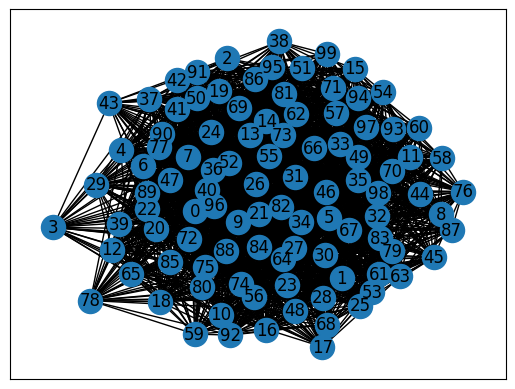

In [24]:
nx.draw_networkx(res.graph)
print(res.fitness)
write_to_file(100, 100, 36, 0.43, 2, 0.45, res, "rezultati/Bonus1.txt")
plt.savefig("slike/BonusTest1.png")

In [25]:
res = ga(100, 42, 0.47, 1, 0.53, 100, 20, 7, 10, 0.05)

-0.13632866449947273


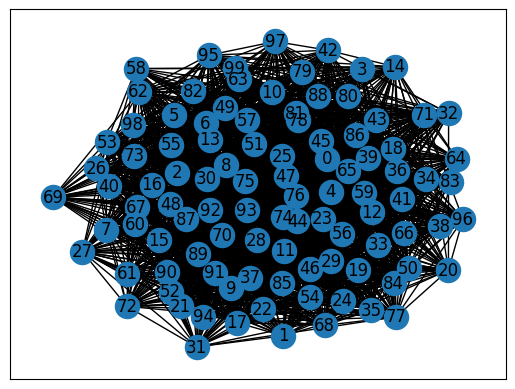

In [26]:
nx.draw_networkx(res.graph)
print(res.fitness)
write_to_file(100, 100, 42, 0.47, 1, 0.53, res, "rezultati/Bonus2.txt")
plt.savefig("slike/BonusTest2.png")

**TEST: ŠTA SE DEŠAVA AKO SE PROMENI VEROVATNOĆA SA KOJOM SE GENERIŠU GRANE U POČETNOM GRAFU**

-0.005622222222222093
-0.005622222222222093
-0.0
-0.0
-0.005712522045855142
-0.015848555815769043
-0.37566199261992617
-0.46733944294699015
-0.21188723623250064
-0.2838353989472806
-0.1109185844873799
-0.14071529552130418
-1.4511361342392424
-1.441273414793612


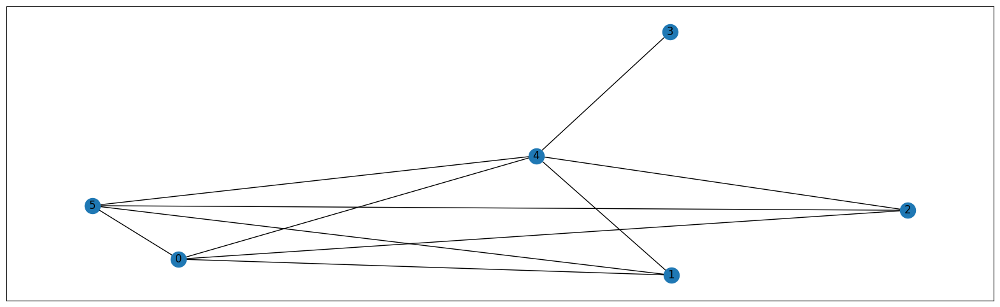

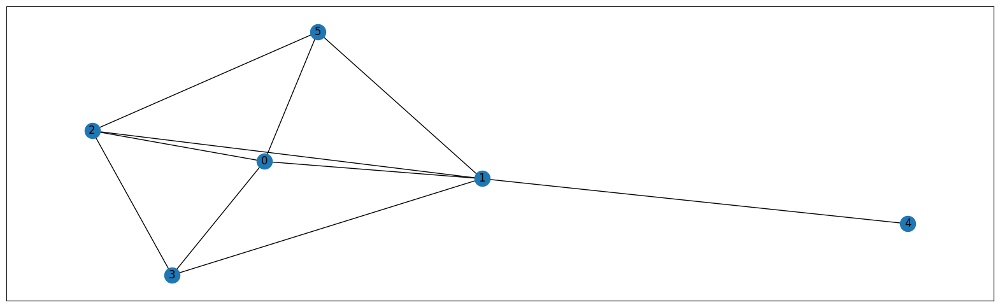

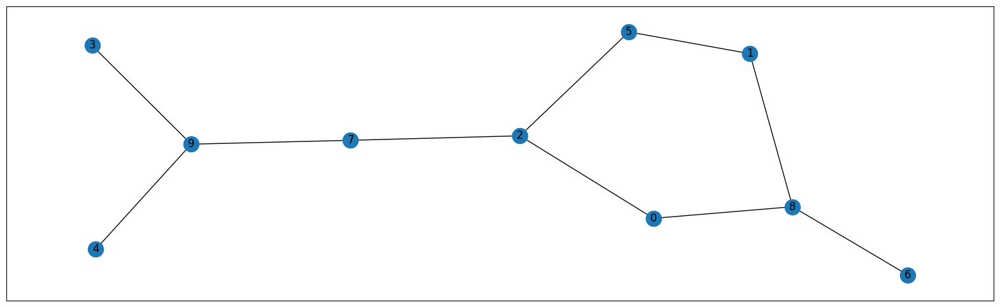

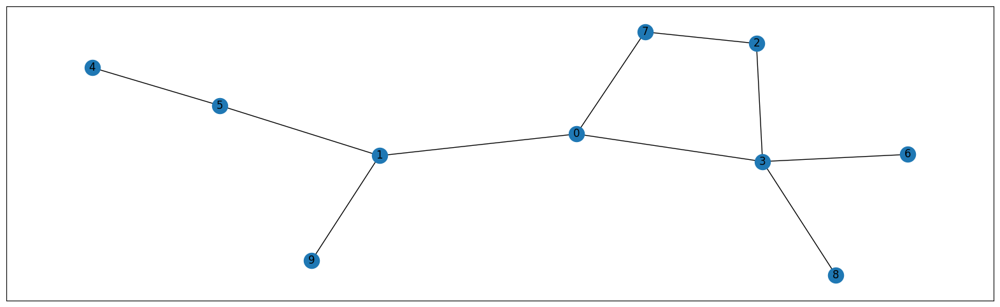

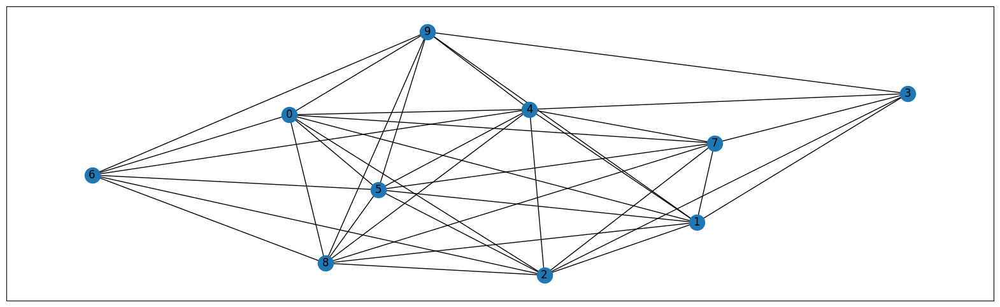

...

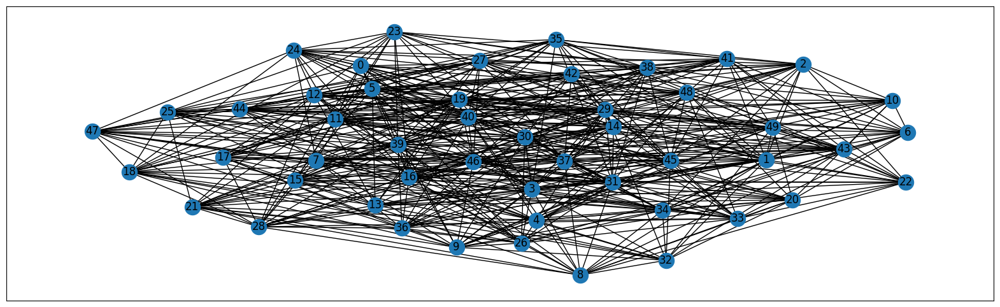

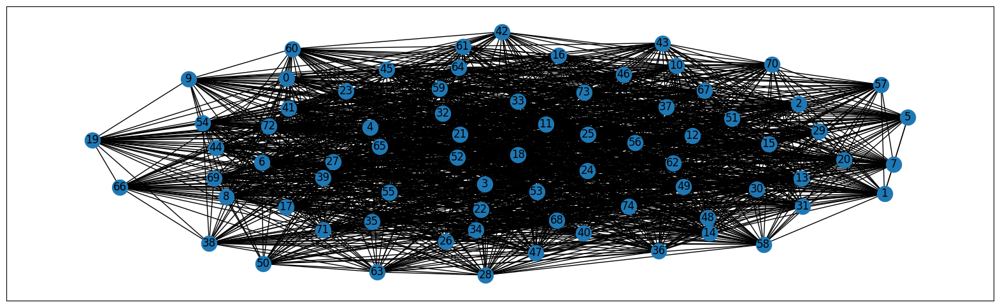

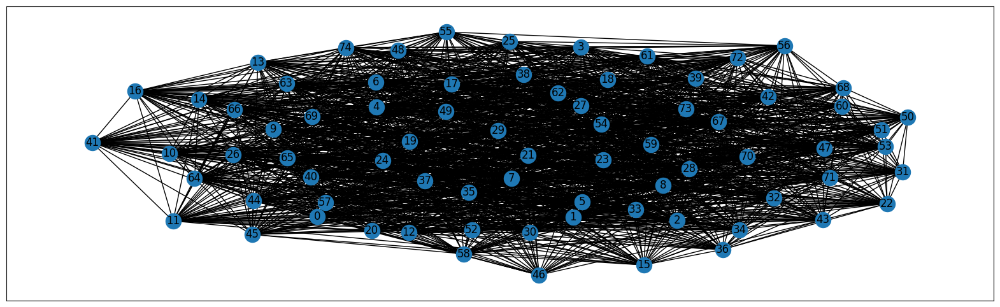

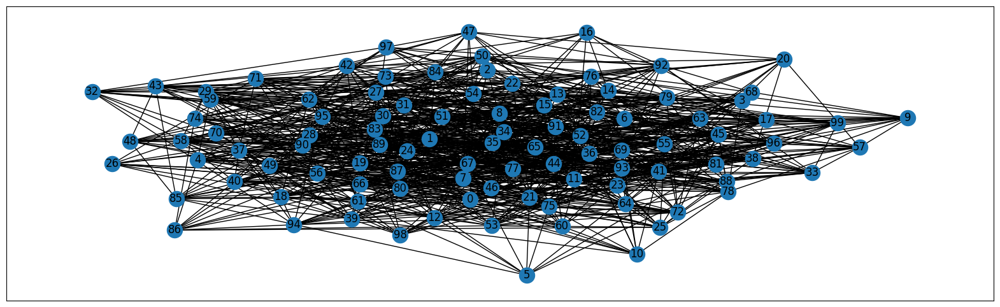

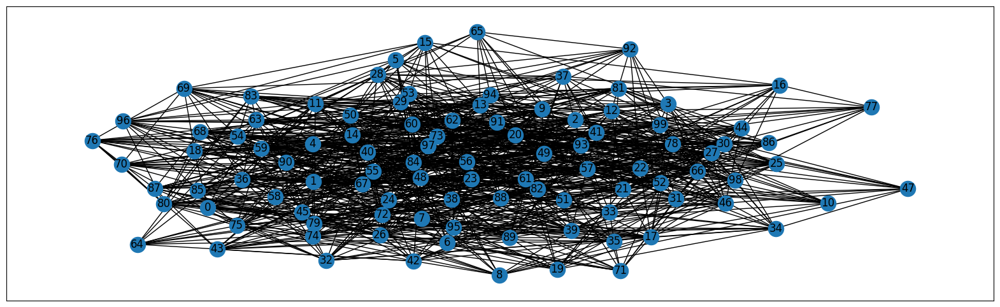

In [27]:
edge_prob = 0.2
fitness_list = []
for i in range(len(num_of_nodes)):
    res = ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], 
            num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1, 1, figsize = (20, 6))
    nx.draw_networkx(res.graph)

    filename = "rezultati/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "prob02.txt"
    write_to_file(population_size[i], num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], 
                  connected_components[i], transitivity[i], res, filename)
    plt.savefig("slike/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "prob02.png")

**ŠTA SE DEŠAVA AKO SE POVEĆA VEROVATNOĆA DA DOĐE DO MUTACIJE?**

-0.06117777777777778
-0.005622222222222093
-0.012000000000000002
-0.015999999999999997
-0.028018633540372477
-0.008549953314659233
-1.028002347714707
-1.1550324678476098
-0.34342872632582455
-0.3599163664500776
-0.17633613692486994
-0.18261250694257553
-2.5296294155103167
-2.5018729431754076


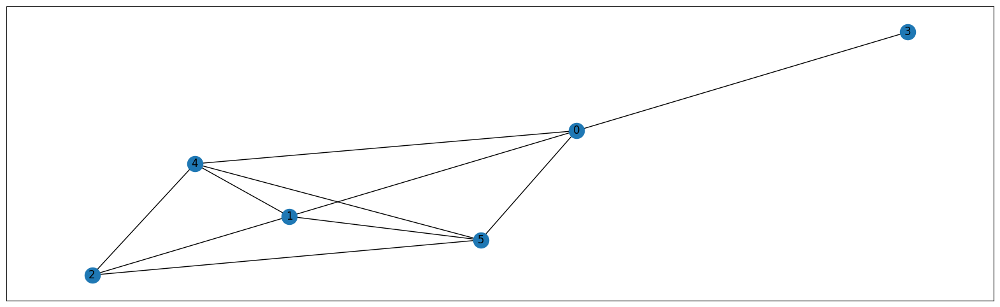

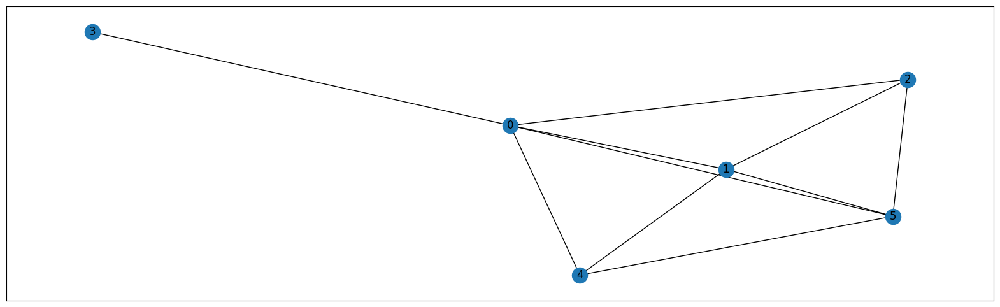

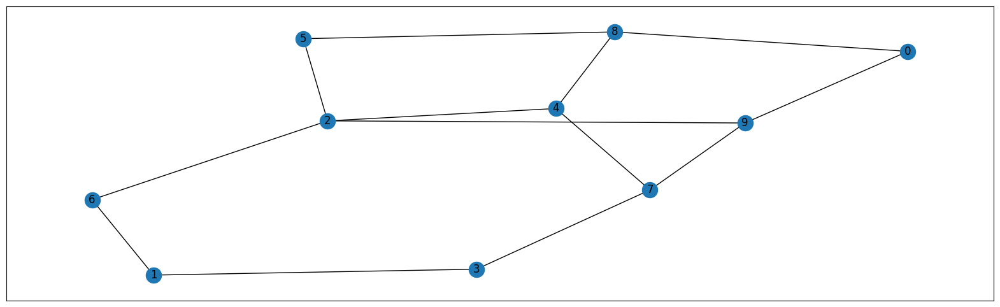

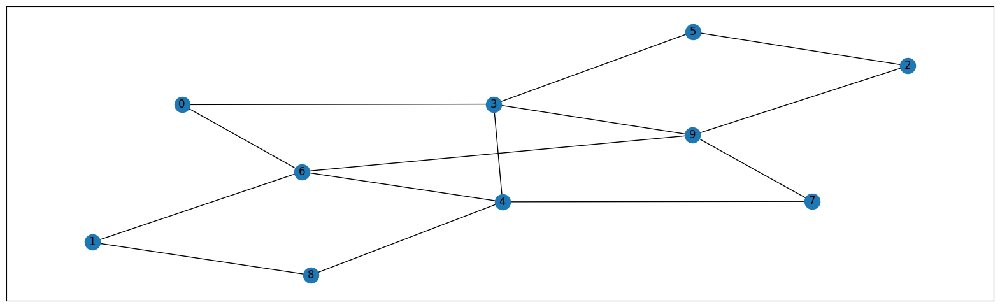

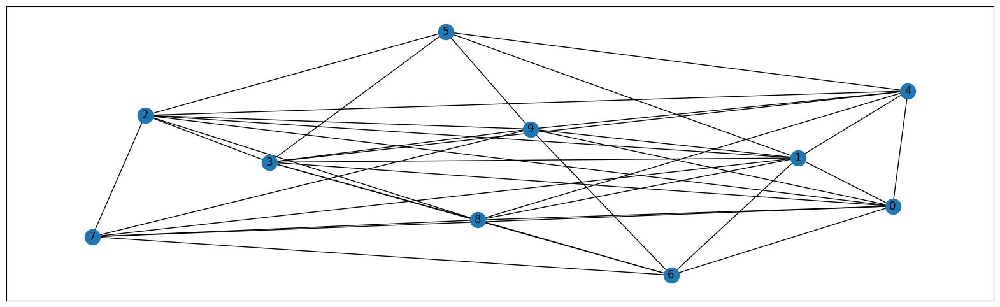

...

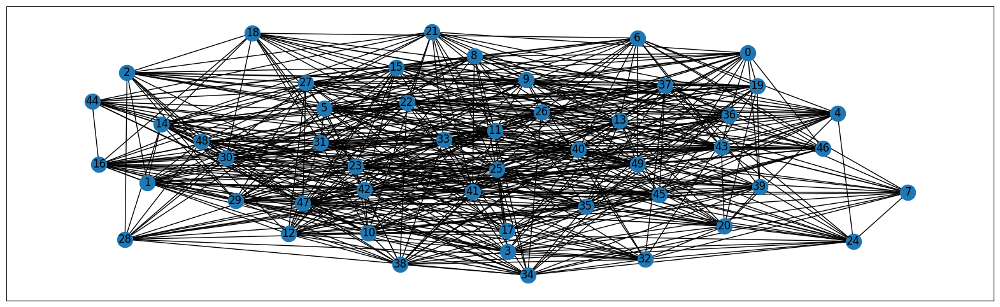

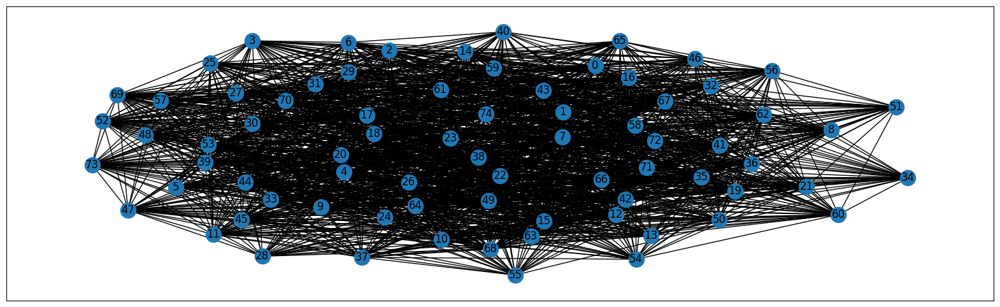

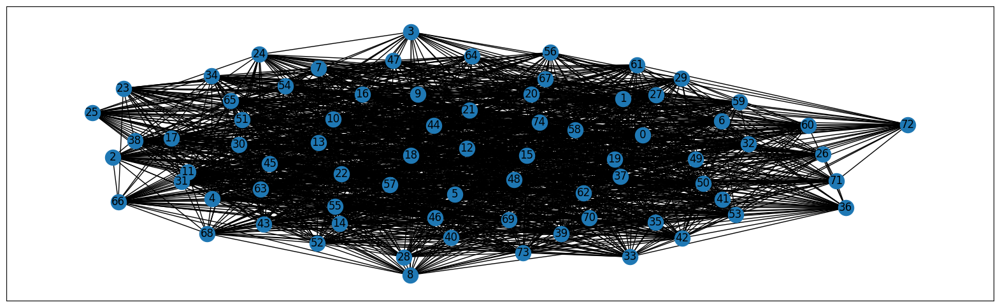

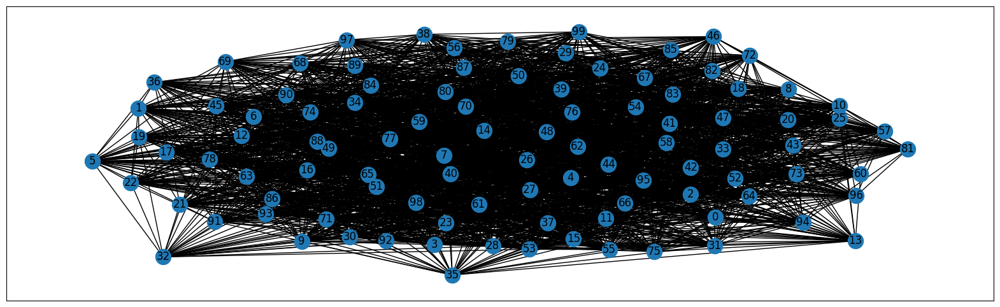

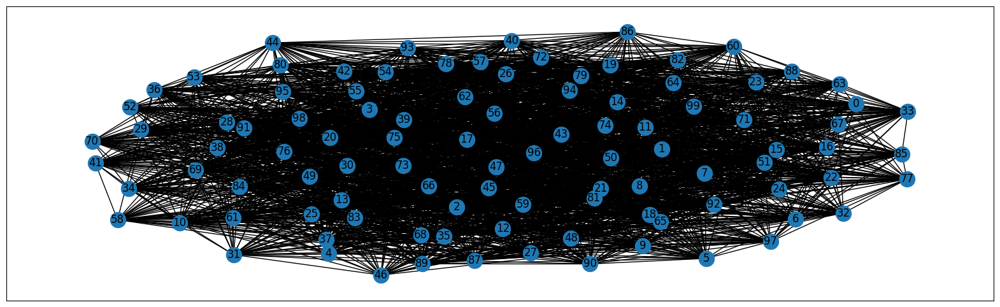

In [28]:
fitness_list = []
mutation_prob = 0.1
edge_prob = 0.5

for i in range(len(num_of_nodes)):
    res = ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], 
            num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1, 1, figsize = (20, 6))
    nx.draw_networkx(res.graph)

    filename = "rezultati/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "mutationProb01.txt"
    write_to_file(population_size[i], num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], 
                  connected_components[i], transitivity[i], res, filename)
    plt.savefig("slike/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "mutationProb01.png")

**DA LI RULETSKA SELEKCIJA DAJE BOLJE REZULTATE?**

In [14]:
import numpy.random as npr
def rouletteSelection(population):
    max = sum([c.fitness for c in population])
    selection_probs = [c.fitness/max for c in population]
    return population[npr.choice(len(population), p=selection_probs)]

In [15]:
def ga(num_nodes = 50, avg_degree = 25, avg_cluster_coeff = 0.5, num_connected_components = 1, transitivity = 0.5,
       population_size = 100, num_generations = 20, tournament_size = 7, elitism_size = 10, mutation_prob = 0.05):
    population = [Individual(num_nodes = num_nodes, avg_degree = avg_degree, avg_clustering_coeff = avg_cluster_coeff, 
                             transitivity = transitivity, num_components = num_connected_components) for _ in range(population_size)]
    new_population = population.copy()
    
    for i in range(num_generations):
        population.sort(key = lambda x: x.fitness, reverse = True)
        new_population[:elitism_size] = population[:elitism_size]
        for j in range(elitism_size, population_size, 2):
            parent1 = rouletteSelection(population)
            parent2 = rouletteSelection(population) 

            # želimo da roditelji budu različite jedinke
            while(parent1 == parent2):
                parent2 = rouletteSelection(population) 
            
            crossover(parent1, parent2, child1 = new_population[j], child2 = new_population[j+1])

            mutation(new_population[j], mutation_prob)
            mutation(new_population[j+1], mutation_prob)
            
            new_population[j].fitness = new_population[j].calc_fitness()
            new_population[j+1].fitness = new_population[j+1].calc_fitness()
        
        population = new_population.copy()
    return max(population, key = lambda x: x.fitness)

-0.35882222222222226
-0.12895555555555546
-0.7236363636363636
-0.5879999999999999
-0.3777777777777778
-0.24011695040710568
-1.374624532671323
-1.3691475635475636
-0.45437317966380203
-0.4782280972914995
-0.285166362017774
-0.2960845929156614
-2.6048549456728383
-2.6308003269331204


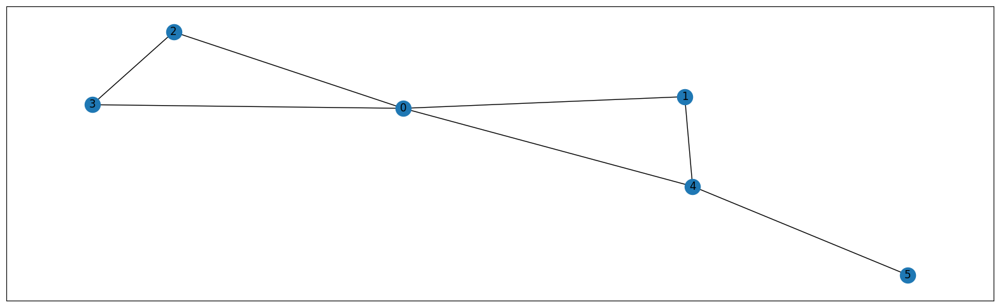

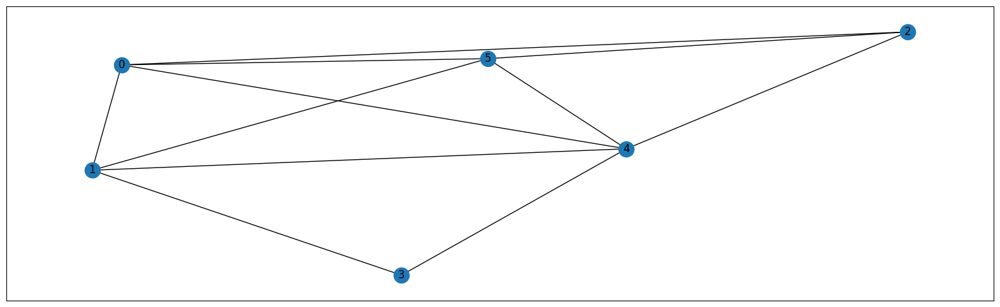

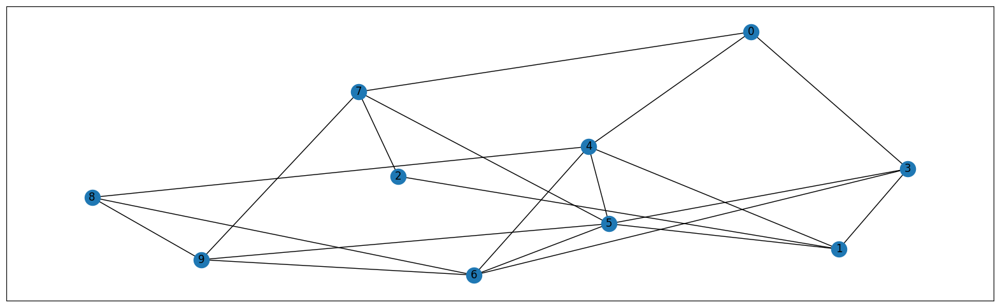

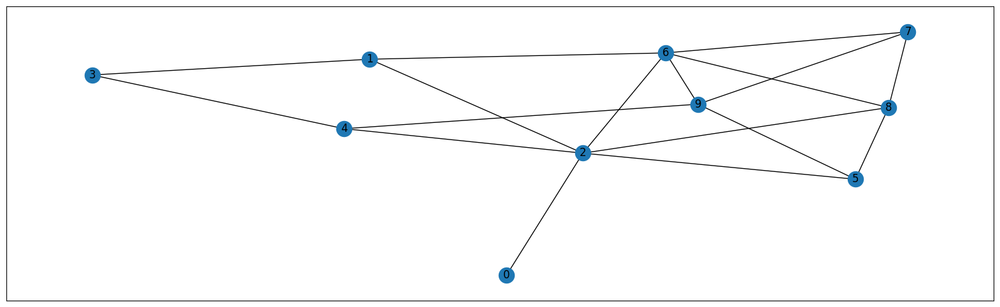

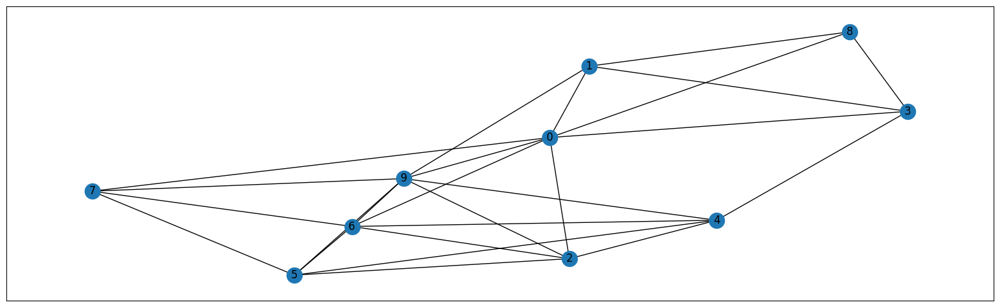

...

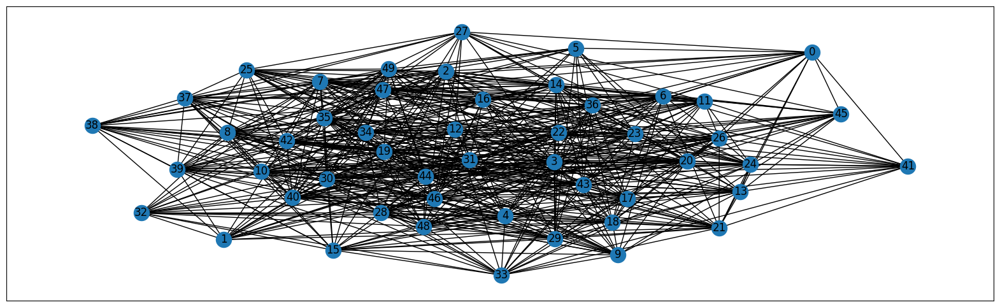

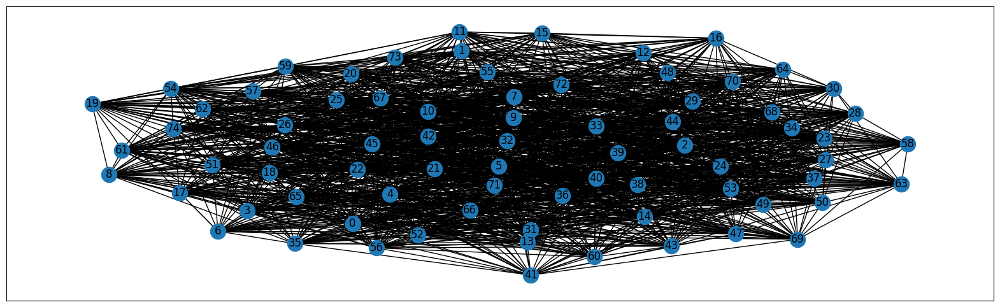

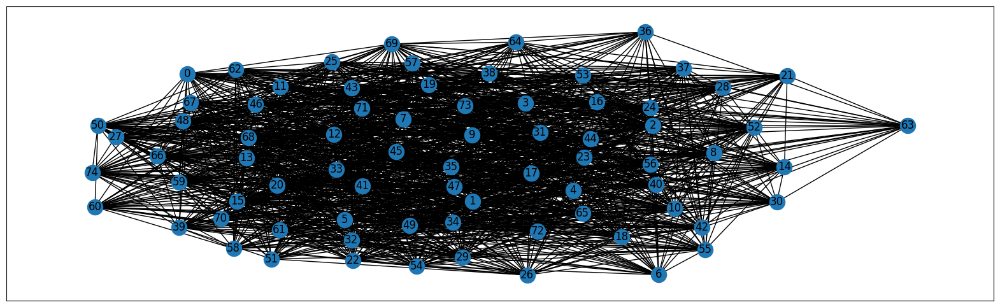

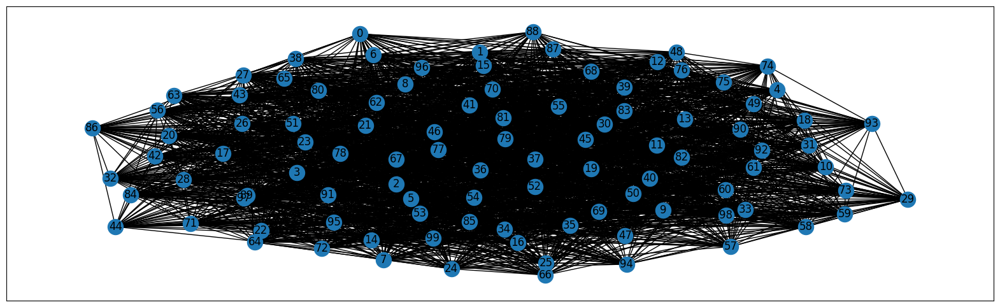

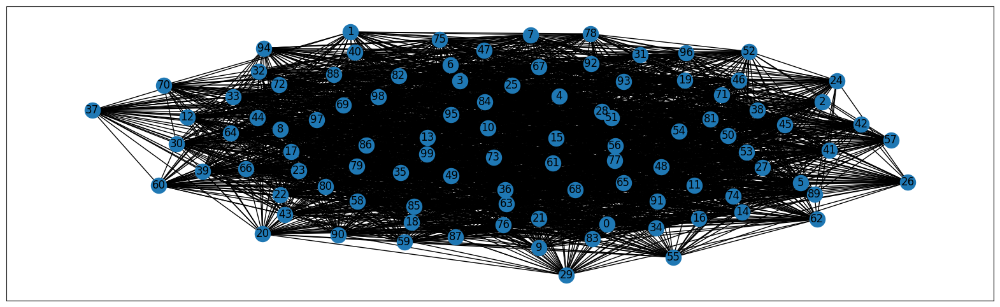

In [17]:
fitness_list = []

for i in range(len(num_of_nodes)):
    res = ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], 
            num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1, 1, figsize = (20, 6))
    nx.draw_networkx(res.graph)

    filename = "rezultati/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "roulette.txt"
    write_to_file(population_size[i], num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], 
                  connected_components[i], transitivity[i], res, filename)
    plt.savefig("slike/Nodes" + str(num_of_nodes[i]) + "pop" + str(population_size[i]) + "roulette.png")